__Afficher quelques exemples d'images et leurs catégories__


Catégories disponibles : ['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'PlantVillage', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_healthy', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_mosaic_virus', 'Tomato__Tomato_YellowLeaf__Curl_Virus']


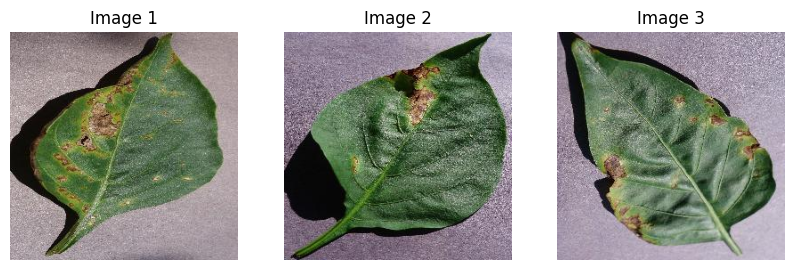

In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Chemin vers le dataset
dataset_dir = "PlantVillage"

# Explorer les différentes classes (plantes/maladies)
classes = os.listdir(dataset_dir)
print("Catégories disponibles :", classes)

# Sélection d'une classe pour visualisation
sample_class = classes[0]  # Exemple: 'Apple___Apple_scab'
sample_images = os.listdir(os.path.join(dataset_dir, sample_class))

# Afficher quelques images de cette classe
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

for i, ax in enumerate(axes):
    image_path = os.path.join(dataset_dir, sample_class, sample_images[i])
    img = Image.open(image_path)
    ax.imshow(img)
    ax.set_title(f"Image {i+1}")
    ax.axis('off')

plt.show()


__Prétraitement des Données__

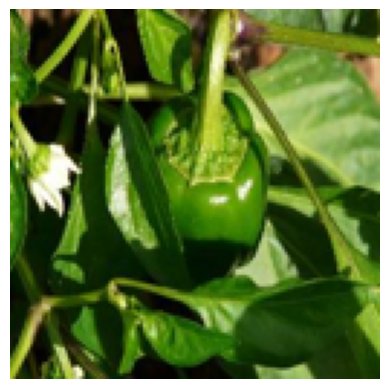

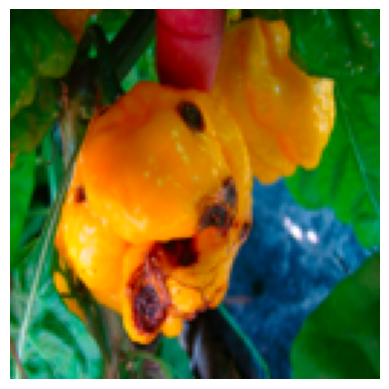

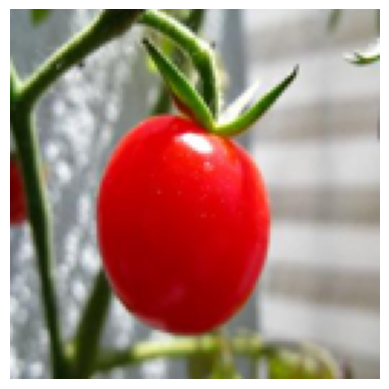

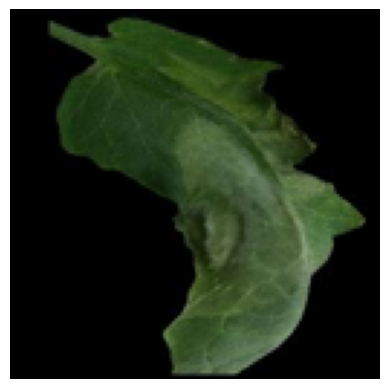

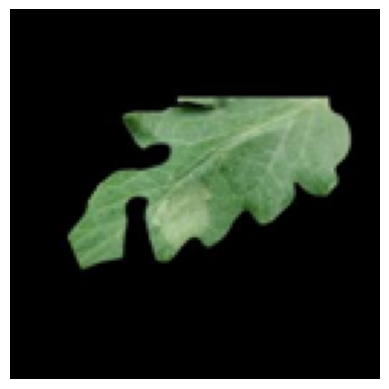

...

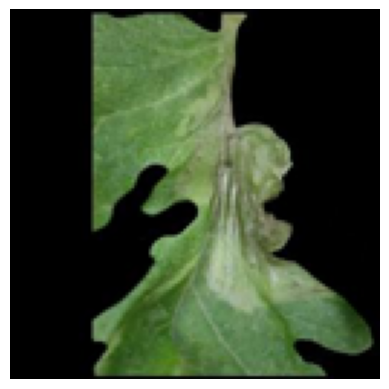

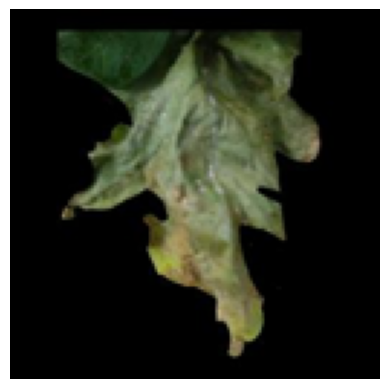

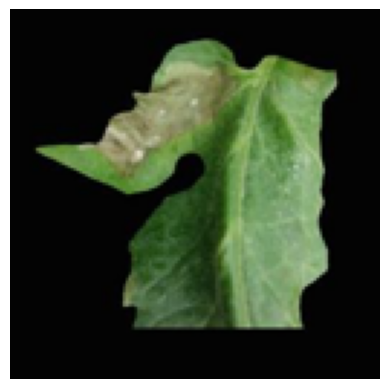

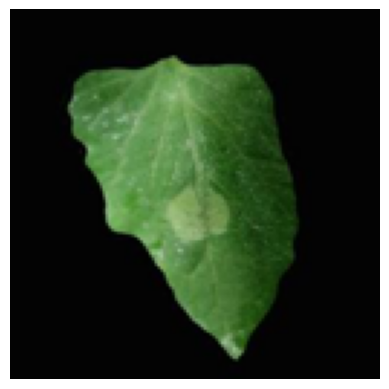

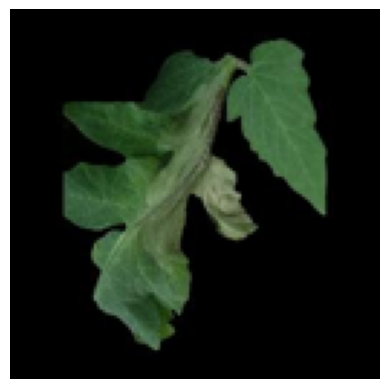

In [2]:

import os
from PIL import Image
import matplotlib.pyplot as plt

# Chemin vers le dossier contenant le dataset d'images
dataset_dir = "PlantVillage"

# Liste des sous-dossiers (chaque sous-dossier correspond à une catégorie)
categories = os.listdir(dataset_dir)

# Redimensionner et afficher les images de toutes les catégories
for category in categories:
    category_dir = os.path.join(dataset_dir, category)
    
    # Vérifier si c'est un dossier
    if os.path.isdir(category_dir):
        # Parcourir toutes les images dans la catégorie
        for image_name in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_name)
            
            # Vérifier si le fichier est une image (par exemple, avec l'extension .jpg)
            if image_path.endswith('.jpg') or image_path.endswith('.png'):
                try:
                    # Charger l'image
                    img = Image.open(image_path)
                    
                    # Redimensionner l'image à 128x128 pixels
                    img_resized = img.resize((128, 128))
                    
                    # Afficher l'image redimensionnée
                    plt.imshow(img_resized)
                    plt.axis('off')  # Masquer les axes
                    plt.show()
                    
                    # Vous pouvez ajouter ici des traitements supplémentaires pour chaque image
                    # Par exemple, vous pouvez la convertir en tableau numpy ou l'utiliser pour entraîner un modèle.
                    
                except Exception as e:
                    print(f"Erreur lors du traitement de l'image {image_name}: {e}")


__Division des Données__

In [4]:
data_dir = 'PlantVillage'
output_dir = 'data_split'

# Create directories for train, val, and test
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")

# Create output directories
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)



In [5]:
import os
import shutil
import random
from math import floor

def split_dataset(data_dir, train_dir, val_dir, test_dir, train_ratio=0.7, val_ratio=0.2):
    # List of classes (subfolders in data_dir)
    classes = os.listdir(data_dir)
    
    for class_name in classes:
        class_path = os.path.join(data_dir, class_name)
        if os.path.isdir(class_path):  # Ensure it's a directory (a class folder)
            # Get all image files in the class folder, skip hidden/system files
            images = [img for img in os.listdir(class_path) 
                      if os.path.isfile(os.path.join(class_path, img)) and not img.startswith('.')]
            random.shuffle(images)  # Shuffle to randomize

            # Calculate split indices
            total_images = len(images)
            train_size = floor(total_images * train_ratio)
            val_size = floor(total_images * val_ratio)
            test_size = total_images - train_size - val_size

            # Split images into train, val, and test sets
            train_images = images[:train_size]
            val_images = images[train_size:train_size + val_size]
            test_images = images[train_size + val_size:]

            # Create class directories in train, val, and test folders
            os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
            os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
            os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

            # Copy images to respective folders
            for image in train_images:
                try:
                    shutil.copy(os.path.join(class_path, image), os.path.join(train_dir, class_name, image))
                except PermissionError as e:
                    print(f"Skipping {image} due to PermissionError: {e}")

            for image in val_images:
                try:
                    shutil.copy(os.path.join(class_path, image), os.path.join(val_dir, class_name, image))
                except PermissionError as e:
                    print(f"Skipping {image} due to PermissionError: {e}")

            for image in test_images:
                try:
                    shutil.copy(os.path.join(class_path, image), os.path.join(test_dir, class_name, image))
                except PermissionError as e:
                    print(f"Skipping {image} due to PermissionError: {e}")

            print(f"Class {class_name}: {len(train_images)} train, {len(val_images)} val, {len(test_images)} test")

# Run the function to split your dataset
split_dataset(data_dir, train_dir, val_dir, test_dir)

print("Dataset splitting complete.")


Class Pepper__bell___Bacterial_spot: 697 train, 199 val, 101 test
Class Pepper__bell___healthy: 1034 train, 295 val, 149 test
Class PlantVillage: 0 train, 0 val, 0 test
Class Potato___Early_blight: 700 train, 200 val, 100 test
Class Potato___healthy: 106 train, 30 val, 16 test
Class Potato___Late_blight: 700 train, 200 val, 100 test
Class Tomato_Bacterial_spot: 1488 train, 425 val, 214 test
Class Tomato_Early_blight: 700 train, 200 val, 100 test
Class Tomato_healthy: 1113 train, 318 val, 160 test
Class Tomato_Late_blight: 1336 train, 381 val, 192 test
Class Tomato_Leaf_Mold: 666 train, 190 val, 96 test
Class Tomato_Septoria_leaf_spot: 1239 train, 354 val, 178 test
Class Tomato_Spider_mites_Two_spotted_spider_mite: 1173 train, 335 val, 168 test
Class Tomato__Target_Spot: 982 train, 280 val, 142 test
Class Tomato__Tomato_mosaic_virus: 261 train, 74 val, 38 test
Class Tomato__Tomato_YellowLeaf__Curl_Virus: 2246 train, 641 val, 322 test
Dataset splitting complete.


__Construction du Modèle__

In [8]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Construction du modèle CNN
model = models.Sequential()

# Première couche de convolution (avec activation ReLU) et max-pooling
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
model.add(layers.MaxPooling2D((2, 2)))

# Deuxième couche de convolution et max-pooling
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Troisième couche de convolution et max-pooling
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Quatrième couche de convolution et max-pooling
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Couche flatten pour aplatir la sortie des convolutions
model.add(layers.Flatten())

# Couche entièrement connectée avec 512 unités
model.add(layers.Dense(512, activation='relu'))

# Couche de sortie avec softmax (pour la classification multiclasse)
model.add(layers.Dense(16, activation='softmax'))  # Changement ici pour 16 classes


C:\Users\Asus\Desktop\archive\.venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [9]:
# Compilation du modèle
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Définir les répertoires des données
train_dir = 'data_split/train'
val_dir = 'data_split/val'
test_dir = 'data_split/test'

# Créer des générateurs d'images pour chaque ensemble de données
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Charger les images depuis les répertoires train, val et test
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(64, 64),  # Redimensionner les images selon votre modèle
    batch_size=32,
    class_mode='categorical'  # Utilisé pour la classification multi-classes
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(64, 64),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(64, 64),
    batch_size=32,
    class_mode='categorical'
)


Found 14441 images belonging to 16 classes.
Found 4122 images belonging to 16 classes.
Found 2076 images belonging to 16 classes.


__Entraînement et Évaluation du Modèle__

In [13]:
# Entraîner le modèle
history = model.fit(
    train_generator,  # Générateur pour les données d'entraînement
    epochs=14,
    validation_data=val_generator  # Générateur pour les données de validation
)


Epoch 1/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step - accuracy: 0.9575 - loss: 0.1131 - val_accuracy: 0.9112 - val_loss: 0.2902
Epoch 2/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step - accuracy: 0.9665 - loss: 0.0982 - val_accuracy: 0.8673 - val_loss: 0.5282
Epoch 3/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.9661 - loss: 0.0985 - val_accuracy: 0.8884 - val_loss: 0.4329
Epoch 4/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.9662 - loss: 0.0975 - val_accuracy: 0.9117 - val_loss: 0.3288
Epoch 5/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.9742 - loss: 0.0737 - val_accuracy: 0.9061 - val_loss: 0.3441
Epoch 6/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.9805 - loss: 0.0556 - val_accuracy: 0.9178 - val_loss: 0.3101
Epoch 7/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - accuracy: 0.9864 - loss: 0.0411 - val_accuracy: 0.9105 - val_loss: 0.3262
Epoch 8/14
452/452 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - accuracy: 0.9797 - loss: 0.0626 - 

In [9]:
# Sauvegarder le modèle au format HDF5
#model.save('modele.h5')


In [ ]:
#Charger le modèle sauvegardé
#from tensorflow.keras.models import load_model
#model = load_model('modele.h5')


__Visualisation et Interprétation des Résultats__

In [14]:
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# Fonction pour évaluer le modèle sur l'ensemble de test
def evaluate_model(test_generator, model):
    true_labels = []
    predicted_labels = []

    # Vérifier la structure des classes
    class_names = list(test_generator.class_indices.keys())
    num_classes = len(class_names)

    # Boucle sur l'ensemble de test
    for i in range(len(test_generator)):
        img, label = test_generator[i]
        
        # Vérifier la forme de l'étiquette (pour s'assurer que l'indexation est correcte)
        print(f"Shape of label: {label.shape}, predictions shape: {model.predict(img).shape}")
        
        # Faire les prédictions du modèle
        predictions = model.predict(img)
        
        # Si les labels sont one-hot encodés, utiliser np.argmax pour obtenir l'indice de la classe
        if len(label.shape) > 1:  # Si l'étiquette est one-hot encodée
            true_labels.extend(np.argmax(label, axis=1))
        else:  # Si l'étiquette est sous forme d'entier (numérique)
            true_labels.extend(label)
        
        # Faire la prédiction et appliquer np.argmax si c'est un vecteur de probabilité
        predicted_labels.extend(np.argmax(predictions, axis=1))

    # Calculer la précision finale
    accuracy = accuracy_score(true_labels, predicted_labels)
    print(f"Précision finale: {accuracy * 100:.2f}%")
    
    # Générer un rapport détaillé de classification
    print("\nRapport de classification:\n")
    print(classification_report(true_labels, predicted_labels, target_names=class_names))

# Évaluer le modèle
evaluate_model(test_generator, model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
Shape of label: (32, 16), predictions shape: (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Shape of label: (32, 16), predictions shape: (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Shape of label: (32, 16), predictions shape: (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Shape of label: (32, 16), predictions shape: (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Shape of label: (32, 16), predictions shape: (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Shape of label: (32, 16), predictions shape: (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Shape of label: (32, 16), predictions shape: (32, 16)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Shape of label: (32, 16), predictions shape: (32, 1

ValueError: Number of classes, 15, does not match size of target_names, 16. Try specifying the labels parameter

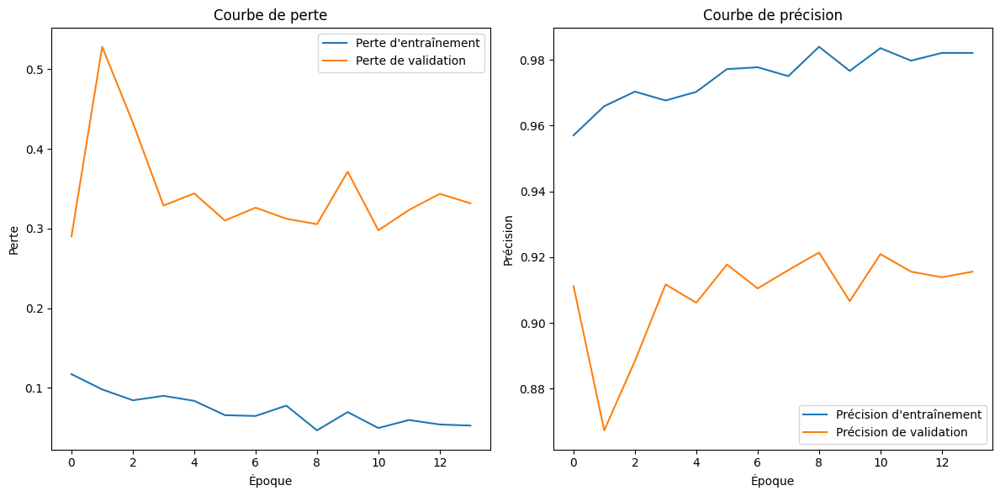

In [15]:
import matplotlib.pyplot as plt

# Supposons que 'history' est l'objet retourné par l'entraînement du modèle
# Par exemple : history = model.fit(...)

def plot_history(history):
    # Courbe de perte
    plt.figure(figsize=(12, 6))

    # Perte d'entraînement et de validation
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Perte d\'entraînement')
    plt.plot(history.history['val_loss'], label='Perte de validation')
    plt.title('Courbe de perte')
    plt.xlabel('Époque')
    plt.ylabel('Perte')
    plt.legend()

    # Précision d'entraînement et de validation
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Précision d\'entraînement')
    plt.plot(history.history['val_accuracy'], label='Précision de validation')
    plt.title('Courbe de précision')
    plt.xlabel('Époque')
    plt.ylabel('Précision')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Exemple d'appel après l'entraînement du modèle
plot_history(history)


In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Prédictions sur le jeu de test
test_predictions = model.predict(test_generator)
predicted_classes = np.argmax(test_predictions, axis=1)  # Convertir les prédictions en classes
true_classes = test_generator.classes  # Obtenir les vraies étiquettes
class_labels = list(test_generator.class_indices.keys())  # Obtenir les noms des classes


 1/65 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step

C:\Users\Asus\Desktop\archive\.venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


65/65 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step 


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


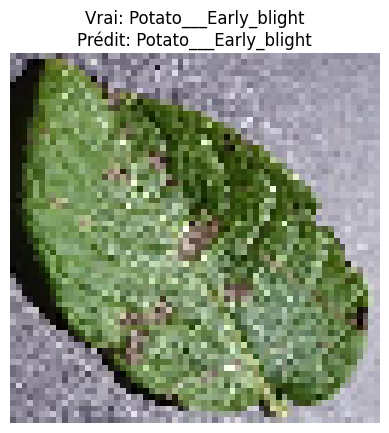

Vrai: Potato___Early_blight
Prédit: Potato___Early_blight
La prédiction est correcte!


In [17]:
import numpy as np
import matplotlib.pyplot as plt

# Fonction pour tester une seule image
def test_single_image(generator, model, class_names):
    # Prendre une seule image du générateur de test
    img, label = generator[0]
    
    # Redimensionner l'image si nécessaire pour correspondre à l'entrée du modèle
    img = img[0]
    input_img = np.expand_dims(img, axis=0)  # Ajouter une dimension pour correspondre à la taille attendue du modèle

    # Prédire la classe de l'image
    prediction = model.predict(input_img)
    predicted_class = np.argmax(prediction)

    # Récupérer le nom des classes pour l'étiquette réelle et prédite
    true_class_name = class_names[np.argmax(label[0])]
    predicted_class_name = class_names[predicted_class]

    # Afficher l'image avec l'étiquette réelle et la prédiction
    plt.imshow(img)
    plt.title(f"Vrai: {true_class_name}\nPrédit: {predicted_class_name}")
    plt.axis('off')
    plt.show()

    # Afficher clairement la prédiction
    print(f"Vrai: {true_class_name}")
    print(f"Prédit: {predicted_class_name}")
    if true_class_name == predicted_class_name:
        print("La prédiction est correcte!")
    else:
        print("La prédiction est incorrecte.")

# Utilisation pour une seule image
test_single_image(test_generator, model, class_labels)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


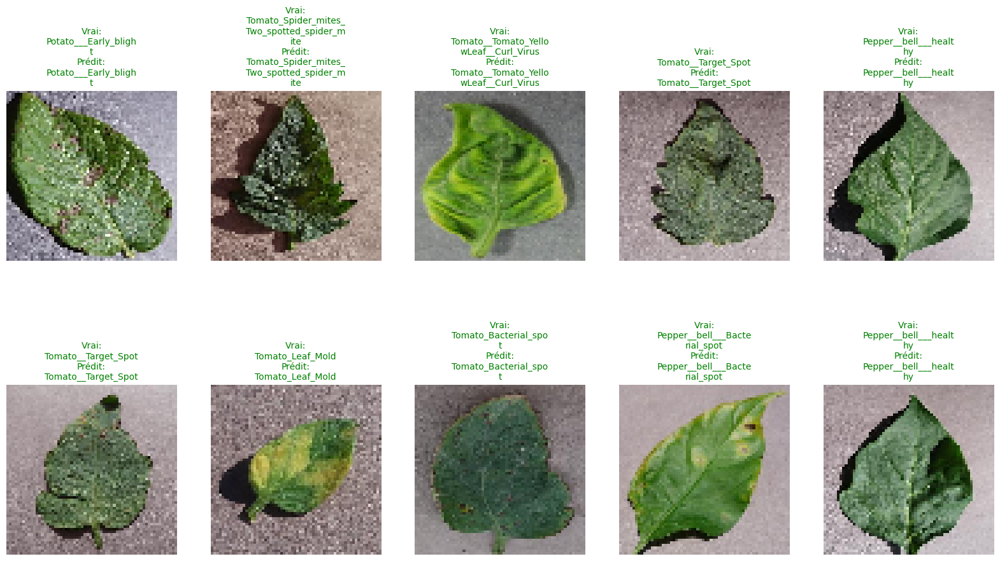

Prédictions correctes: 10/10


In [18]:
import numpy as np
import matplotlib.pyplot as plt
import textwrap

# Fonction pour tester plusieurs images et afficher les résultats
def test_multiple_images(generator, model, class_names, num_images=10):
    img, label = generator[0]  # Récupérer un lot d'images
    correct_predictions = 0

    # Paramètres d'affichage
    fig, axes = plt.subplots(2, 5, figsize=(20, 10))  # Adapter la taille
    fig.subplots_adjust(hspace=0.5)  # Ajouter de l'espace entre les images

    # Tester et afficher les prédictions pour plusieurs images
    for i in range(num_images):
        input_img = np.expand_dims(img[i], axis=0)  # Redimensionner pour le modèle

        # Prédire la classe
        prediction = model.predict(input_img)
        predicted_class = np.argmax(prediction)
        true_class = np.argmax(label[i])

        # Obtenir les noms des classes
        true_class_name = class_names[true_class]
        predicted_class_name = class_names[predicted_class]

        # Couper les noms de classes s'ils sont trop longs
        wrapped_true_class = '\n'.join(textwrap.wrap(true_class_name, width=20))
        wrapped_predicted_class = '\n'.join(textwrap.wrap(predicted_class_name, width=20))

        # Afficher l'image avec l'étiquette réelle et prédite
        ax = axes[i // 5, i % 5]  # Sélectionner la position sur la grille
        ax.imshow(img[i])
        ax.axis('off')
        
        # Couleur de la prédiction (vert si correct, rouge si incorrect)
        color = 'green' if true_class == predicted_class else 'red'
        
        # Afficher le titre avec la classe réelle et la prédiction
        ax.set_title(f"Vrai:\n{wrapped_true_class}\nPrédit:\n{wrapped_predicted_class}", fontsize=10, color=color)

        # Compter les bonnes prédictions
        if true_class == predicted_class:
            correct_predictions += 1

    # Afficher le nombre total de prédictions correctes
    plt.show()
    print(f"Prédictions correctes: {correct_predictions}/{num_images}")

# Utilisation pour plusieurs images
test_multiple_images(test_generator, model, class_labels, num_images=10)
